In [1]:
### Import all the required libraries
import os
import sys

import pandas as pd
import numpy as np

import pymysql.cursors          
    
from matplotlib import pyplot as plt
get_ipython().magic(u'matplotlib inline')


import warnings
# Plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns

import plotly

import plotly.figure_factory as ff
import plotly.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

# Initializing some settings
pyoff.init_notebook_mode(connected=True)
get_ipython().magic('matplotlib inline')

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot


ModuleNotFoundError: No module named 'pymysql'

In [2]:
#### For mysql connectivity
connection = pymysql.connect(host='172.16.0.218',
                             user='insofeadmin',
                             password='insofe_password',
                             db='insofe_results',
                             charset='utf8mb4',
                             cursorclass=pymysql.cursors.DictCursor)

try:
    with connection.cursor() as cursor:
### Extract data from active_emp_details table

        query = "SELECT * FROM `active_emp_details`"
        cursor.execute(query)
        active_employees = cursor.fetchall()

### Extract data from dept_aggr_by_gender table
        query = "SELECT * FROM `dept_aggr_by_gender`"
        cursor.execute(query)
        dept_aggr_gender = cursor.fetchall()

### Extract data from dept_aggr table
        query = "SELECT * FROM `dept_aggr`"
        cursor.execute(query)
        dept_aggr_all = cursor.fetchall()
        #print(dept_aggr_all)
        
finally:
    connection.close()

In [3]:
os.getcwd()

'/nfsroot/data/home/thomasj/BIONHADOOP'

In [4]:
def make_go_bar(x,y,text = '',name= '',color= 'green'):
    return go.Bar(x=x,
                  y = y,
                  text = text,textposition = 'auto',
                 textfont=dict(
        family='sans serif',
        size=20,
        color='black'),
        marker=dict(
        color=color,
                      
        line=dict(
            color='black',
            width=1)),name= name,opacity=0.80)

In [5]:
active_employees_DF = pd.DataFrame(active_employees, columns=["emp_no", "first_name", "last_name", "gender", "birth_date", "hire_date", "dept_no", "dept_name", "dept_from_date", "salary", "salary_from_date", "title", "title_from_date", "manager_emp_no", "manager_first_name", "manager_last_name", "manager_gender", "manager_birth_date", "manager_hire_date", "manager_from_date", "age", "tenure", "manager_age", "manager_tenure", "salary_since", "role_since"])
dept_aggr_all_DF = pd.DataFrame(dept_aggr_all, columns=["dept_no", "dept_name", "tot_emp", "tot_sal", "min_sal", "max_sal", "avg_sal", "min_age", "max_age", "avg_age", "min_tenure", "max_tenure", "avg_tenure", "avg_sal_change", "avg_role_change"]) 
dept_aggr_gender_DF = pd.DataFrame(dept_aggr_gender, columns=["dept_no", "dept_name", "gender", "tot_emp", "tot_sal", "min_sal", "max_sal", "avg_sal", "min_age", "max_age", "avg_age", "min_tenure", "max_tenure", "avg_tenure", "avg_sal_change", "avg_role_change"])

In [6]:
active_employees_DF.head()

,emp_no,first_name,last_name,gender,birth_date,hire_date,dept_no,dept_name,dept_from_date,salary,...,manager_gender,manager_birth_date,manager_hire_date,manager_from_date,age,tenure,manager_age,manager_tenure,salary_since,role_since
0,1,Margareta,Markovitch,M,1958-09-12,1986-01-01,d001,Marketing,1986-01-01,107407,...,M,1967-06-21,1988-04-12,1993-10-01,60,32,51,30,15,26
1,2,Ebru,Alpin,M,1961-10-28,1986-01-01,d002,Finance,1986-01-01,87443,...,F,1959-03-28,1986-01-14,1990-12-17,57,32,59,32,15,27
2,3,Shirish,Ossenbruggen,F,1955-06-24,1986-01-01,d003,Human Resources,1986-01-01,78229,...,F,1960-12-02,1986-08-04,1993-03-21,63,32,57,32,15,25
3,4,Krassimir,Wegerle,F,1958-06-08,1986-01-01,d004,Production,1986-01-01,71583,...,M,1981-07-27,2001-02-05,2005-08-30,60,32,37,17,15,29
4,5,DeForest,Hagimont,M,1959-07-08,1986-01-01,d005,Development,1986-01-01,71903,...,F,1970-04-25,1989-10-21,1995-04-25,59,32,48,29,15,25


In [7]:
dept_aggr_all_DF

,dept_no,dept_name,tot_emp,tot_sal,min_sal,max_sal,avg_sal,min_age,max_age,avg_age,min_tenure,max_tenure,avg_tenure,avg_sal_change,avg_role_change
0,d001,Marketing,15803,1164937153,12501,144128,73716.20,23,66,46.06,1,32,20.62,9.36,14.66
1,d002,Finance,13494,976025645,12701,141395,72330.34,23,66,45.96,1,32,20.35,9.27,14.50
2,d003,Human Resources,13876,813433698,12669,140953,58621.63,23,66,46.00,1,32,20.44,9.31,14.55
3,d004,Production,54280,3346570168,12568,137497,61653.84,23,66,46.64,1,32,21.47,9.67,15.50
4,d005,Development,62344,3827231785,12582,142434,61388.94,23,66,46.63,1,32,21.50,9.69,15.47
5,d006,Quality Management,15679,942992865,12596,137308,60143.69,23,66,46.00,1,32,20.41,9.30,14.79
6,d007,Sales,38634,3174290640,12524,157220,82163.14,23,66,46.52,1,32,21.32,9.61,15.15
7,d008,Research,16432,1022748401,12817,137344,62241.26,23,66,46.13,1,32,20.67,9.39,14.78
8,d009,Customer Service,18580,1143916637,12505,142950,61567.10,23,66,46.21,1,32,20.77,9.42,14.81
9,d010,Analytics,1002,76457358,12567,137498,76304.75,23,48,35.55,1,5,3.31,3.31,3.31


In [8]:
dept_aggr_gender_DF

,dept_no,dept_name,gender,tot_emp,tot_sal,min_sal,max_sal,avg_sal,min_age,max_age,avg_age,min_tenure,max_tenure,avg_tenure,avg_sal_change,avg_role_change
0,d001,Marketing,F,6338,465218859,13110,137842,73401.52,23,66,45.79,1,32,20.27,9.22,14.39
1,d001,Marketing,M,9465,699718294,12501,144128,73926.92,23,66,46.24,1,32,20.85,9.46,14.85
2,d002,Finance,F,5541,402511864,13007,137300,72642.46,23,66,45.85,1,32,20.06,9.17,14.37
3,d002,Finance,M,7953,573513781,12701,141395,72112.89,23,66,46.03,1,32,20.55,9.34,14.58
4,d003,Human Resources,F,5638,332413592,12669,137321,58959.49,23,66,45.81,1,32,20.14,9.20,14.33
5,d003,Human Resources,M,8238,481020106,13320,140953,58390.40,23,66,46.14,1,32,20.65,9.38,14.70
6,d004,Production,F,21895,1348749829,13612,137497,61600.81,23,66,46.62,1,32,21.41,9.65,15.46
7,d004,Production,M,32385,1997820339,12568,137378,61689.68,23,66,46.66,1,32,21.52,9.69,15.52
8,d005,Development,F,25023,1535092555,12582,142434,61347.26,23,66,46.57,1,32,21.40,9.64,15.43
9,d005,Development,M,37321,2292139230,12876,137119,61416.88,23,66,46.67,1,32,21.57,9.71,15.50


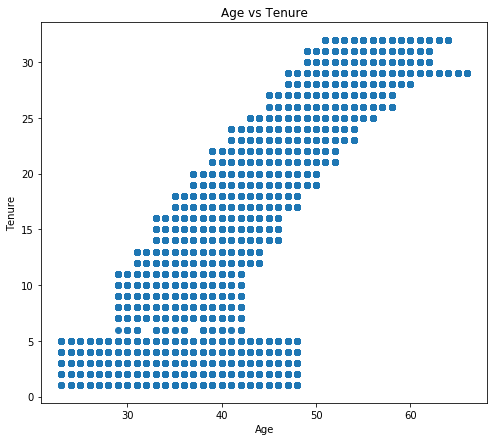

In [9]:
### Draw a scatter plot to identify the relation between employees age and tenure
# plt.scatter(active_employees_DF.age, active_employees_DF.tenure)
X = active_employees_DF.age
Y = active_employees_DF.tenure
plt.figure(figsize=(8,7))
plt.xlabel("Age")
plt.ylabel("Tenure")
plt.title("Age vs Tenure")
plt.scatter(X,Y)
plt.show()

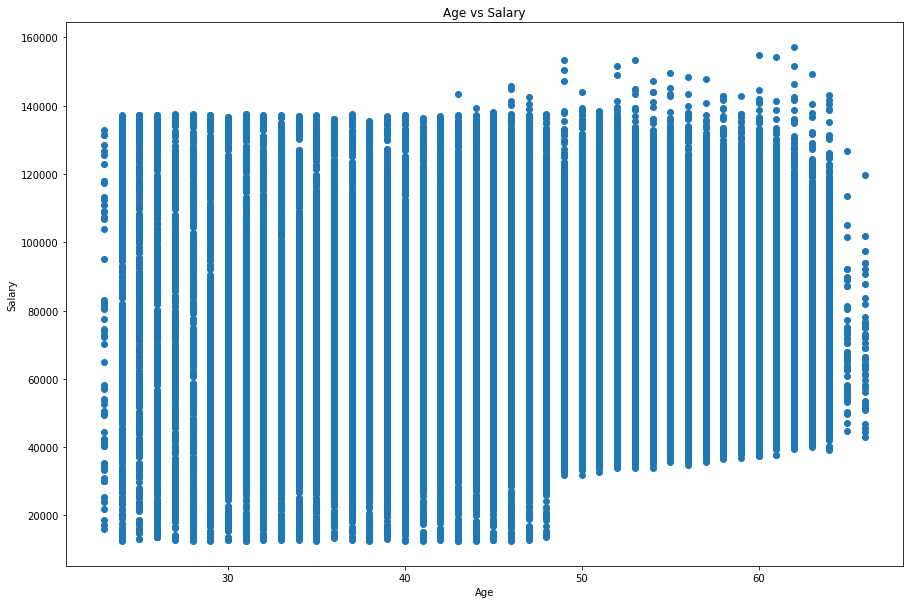

In [10]:
### Draw a scatter plot to identify the relation between employees age and salary
temp = active_employees_DF.sample(frac=1)
X = temp.age.astype(int)
Y = temp.salary.astype(int)
plt.figure(figsize=(15,10))
plt.xlabel("Age")
plt.ylabel("Salary")
plt.title("Age vs Salary")
plt.scatter(X,Y)
plt.show()

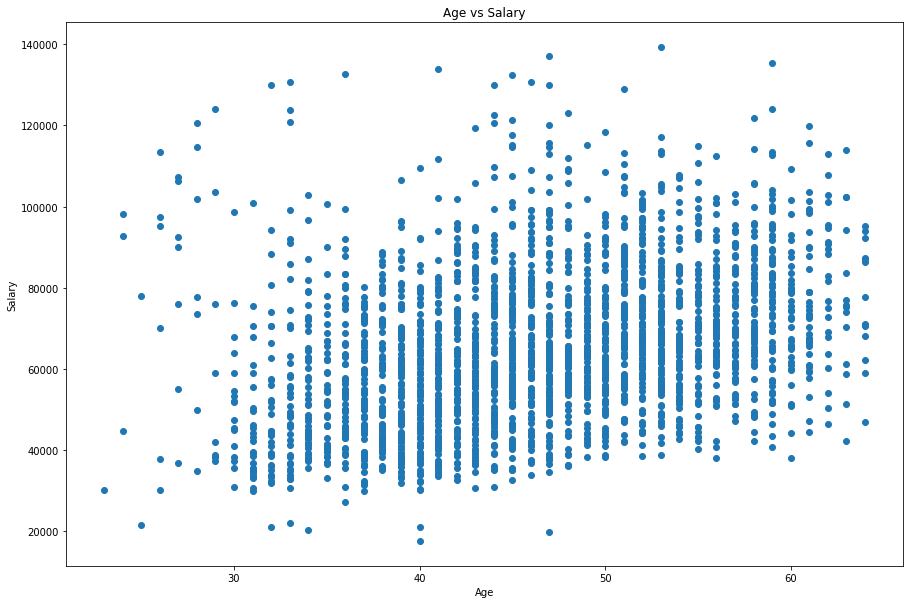

In [11]:
### Draw a scatter plot to identify the relation between employees age and salary
temp = active_employees_DF.sample(frac=0.01)
X = temp.age
Y = temp.salary
plt.figure(figsize=(15,10))
plt.xlabel("Age")
plt.ylabel("Salary")
plt.title("Age vs Salary")
plt.scatter(X,Y)
plt.show()

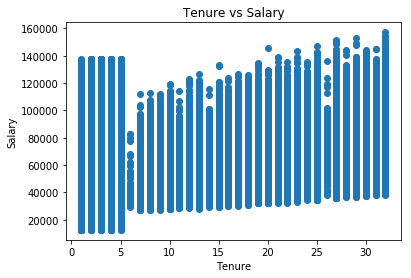

In [12]:
### Draw a scatter plot to identify the relation between employees tenure and salary
X = active_employees_DF.tenure
Y = active_employees_DF.salary
plt.xlabel("Tenure")
plt.ylabel("Salary")
plt.title("Tenure vs Salary")
plt.scatter(X,Y)
plt.show()

In [13]:
active_employees_DF.columns

Index([u'emp_no', u'first_name', u'last_name', u'gender', u'birth_date',
       u'hire_date', u'dept_no', u'dept_name', u'dept_from_date', u'salary',
       u'salary_from_date', u'title', u'title_from_date', u'manager_emp_no',
       u'manager_first_name', u'manager_last_name', u'manager_gender',
       u'manager_birth_date', u'manager_hire_date', u'manager_from_date',
       u'age', u'tenure', u'manager_age', u'manager_tenure', u'salary_since',
       u'role_since'],
      dtype='object')

In [14]:
temp = pd.DataFrame(active_employees_DF.age.value_counts(),columns=['age']).reset_index()
temp.columns = ['age','count']
def bar_for_plots(i,tablename):
    one =  make_go_bar( x=temp.age,y=temp[i],text = temp[i],name='{}'.format(i))
    data = [one]
    layout = go.Layout(
    title='{}({})'.format(i,tablename),showlegend=True,xaxis=dict(
        title='Bins',
        showticklabels=True,
        tickangle=0,),)
    fig = go.Figure(data=data,layout=layout)
    return iplot(fig)
for i in temp.columns:
    if i not in ['age']:
        bar_for_plots(i,"active_employees_DF")

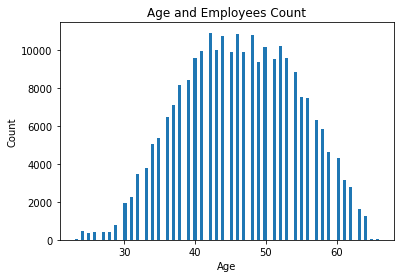

In [15]:
### Draw histogram for the employees count in each age group
plt.xlabel("Age")
plt.ylabel("Count")
plt.title("Age and Employees Count")
plt.hist(active_employees_DF.age,bins=100)
plt.show()

### Draw histogram for the employees count in each age group

In [16]:
trace1 = go.Histogram(x=active_employees_DF.age,marker=dict(
        color='red'
    ),opacity=0.40)
layout = go.Layout(
    title='Histogram of Employee Age')
fig = go.Figure(data=[trace1], layout=layout)
iplot(fig)

### Draw histogram for the employees count by tenure


In [17]:
trace1 = go.Histogram(x=active_employees_DF.tenure,marker=dict(
        color='blue'
    ),opacity=0.80)
layout = go.Layout(
    title='Histogram of Employee Tenure')
fig = go.Figure(data=[trace1], layout=layout)
iplot(fig)

### Draw histogram for the employees count by salary


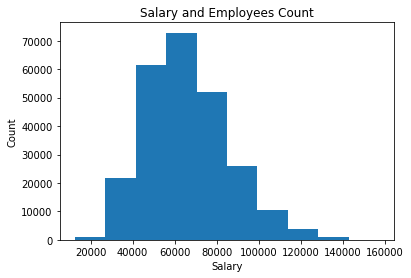

In [18]:
plt.xlabel("Salary")
plt.ylabel("Count")
plt.title("Salary and Employees Count")
plt.hist(active_employees_DF.salary)
plt.show()

### Extract Male and Female employees counts in each department


In [19]:
### Extract Male and Female employees counts in each department
#Y1 = dept_aggr_gender_DF['tot_emp'][dept_aggr_gender_DF['gender'] == 'M']
#Y2 = dept_aggr_gender_DF['tot_emp'][dept_aggr_gender_DF['gender'] == 'F']

In [20]:
dept_aggr_gender_DF.columns

Index([u'dept_no', u'dept_name', u'gender', u'tot_emp', u'tot_sal', u'min_sal',
       u'max_sal', u'avg_sal', u'min_age', u'max_age', u'avg_age',
       u'min_tenure', u'max_tenure', u'avg_tenure', u'avg_sal_change',
       u'avg_role_change'],
      dtype='object')

In [21]:
per_dept_gender_dist = dept_aggr_gender_DF.groupby(['dept_name','gender','tot_emp']).size().reset_index().iloc[:,:-1]

In [22]:
m = per_dept_gender_dist[per_dept_gender_dist.gender=='M']
f = per_dept_gender_dist[per_dept_gender_dist.gender=='F']

In [23]:
m

,dept_name,gender,tot_emp
1,Analytics,M,511
3,Customer Service,M,11065
5,Development,M,37321
7,Finance,M,7953
9,Human Resources,M,8238
11,Marketing,M,9465
13,Production,M,32385
15,Quality Management,M,9210
17,Research,M,9763
19,Sales,M,23159


In [24]:
f

,dept_name,gender,tot_emp
0,Analytics,F,491
2,Customer Service,F,7515
4,Development,F,25023
6,Finance,F,5541
8,Human Resources,F,5638
10,Marketing,F,6338
12,Production,F,21895
14,Quality Management,F,6469
16,Research,F,6669
18,Sales,F,15475


In [25]:
Y2 = m.tot_emp
Y1 = f.tot_emp

In [26]:
# trace1 = go.Bar(
#     x=f.dept_name,
#     y=Y1,text = Y1,
#     name='Female'
# )
trace1 = make_go_bar( x=f.dept_name,
    y=Y1,text = Y1,name = 'Female',
    color='red')

trace2 = make_go_bar( x=m.dept_name,
    y=Y2,text = Y2,name = 'Male',
    color='blue')
# trace2 = go.Bar(
#     x=m.dept_name,
#     y=Y2,text = Y2,
#     name='Male')


data = [trace1, trace2]
layout = go.Layout(
    barmode='group'
)

layout = go.Layout(
    title='{}'.format("Gender Distribution in the Department"),showlegend=True,xaxis=dict(
        title='Bins',
        showticklabels=True,
        tickangle=30,),)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='grouped-bar')



In [27]:
# Randomly sample 5% of your dataframe
sample_5percent = active_employees_DF.sample(frac=0.05)

# Randomly sample 1000 rows from your dataframe
#sample_5percent = active_employees_DF.sample(1000)
sample_5percent
#For either approach above, you can get the rest of the rows by doing:

,emp_no,first_name,last_name,gender,birth_date,hire_date,dept_no,dept_name,dept_from_date,salary,...,manager_gender,manager_birth_date,manager_hire_date,manager_from_date,age,tenure,manager_age,manager_tenure,salary_since,role_since
194684,243376,Vivian,Daescu,M,1974-06-24,2003-07-18,d004,Production,2003-07-18,55594,...,M,1981-07-27,2001-02-05,2005-08-30,44,15,37,17,6,15
58474,73157,Kamakshi,Munoz,F,1959-06-08,1990-01-19,d007,Sales,2000-03-17,68962,...,M,1961-03-16,1989-12-30,1994-03-07,59,28,57,28,13,13
160013,200114,Mats,Stafford,M,1976-01-26,2000-06-01,d007,Sales,2002-12-03,71505,...,M,1961-03-16,1989-12-30,1994-03-07,42,18,57,28,7,15
41365,51651,Gal,Slaats,M,1960-04-12,1989-06-12,d004,Production,2002-06-10,42958,...,M,1981-07-27,2001-02-05,2005-08-30,58,29,37,17,13,16
82792,103698,Marc,Skogmar,M,1968-02-07,1992-12-18,d009,Customer Service,1995-12-04,95062,...,M,1974-03-25,1996-07-10,2003-01-03,50,25,44,22,12,23
150634,188468,Prodip,Kemmerer,M,1968-10-05,1998-12-03,d004,Production,2002-07-30,63267,...,M,1981-07-27,2001-02-05,2005-08-30,50,19,37,17,8,9
117795,147289,Marko,Dehkordi,M,1964-06-18,1995-05-17,d005,Development,1995-05-17,60927,...,F,1970-04-25,1989-10-21,1995-04-25,54,23,48,29,10,16
82984,103931,Pramod,Schade,M,1964-02-24,1992-12-20,d008,Research,1992-12-20,68285,...,F,1962-06-27,1993-01-31,1996-04-08,54,25,56,25,11,25
233799,292054,Shridhar,Gelosh,M,1979-05-20,2009-08-08,d005,Development,2010-02-20,43471,...,F,1970-04-25,1989-10-21,1995-04-25,39,9,48,29,4,8
22475,28062,Tse,Kawashima,F,1959-04-30,1987-10-21,d008,Research,1999-11-01,57530,...,F,1962-06-27,1993-01-31,1996-04-08,59,31,56,25,14,22


#### Let  us see the salary distributions of male and female employees


In [28]:
trace1 = go.Histogram(x = sample_5percent[sample_5percent.gender == 'M'].salary,name='Male',marker=dict(
        color='blue'
    ),opacity=0.40)

trace2 = go.Histogram(x = sample_5percent[sample_5percent.gender == 'F'].salary,name='Female',marker=dict(
        color='red'
    ),opacity=0.80)

data = [trace1, trace2]

layout = go.Layout(barmode='overlay',title='Histogram of Male and Female Employee Salary Distributions')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')